<a href="https://colab.research.google.com/github/aSafarpoor/DIP/blob/main/DIP_hw3_99210301.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from numpy.core.shape_base import block
from google.colab.patches import cv2_imshow
from PIL import Image
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from scipy.fft import fft, fftfreq, fft2, ifft2
from  scipy import stats
from google.colab.patches import cv2_imshow
from math import exp
from sklearn.decomposition import PCA
import tifffile as tiff
from tqdm import tqdm
import pandas as pd
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
import imageio

In [19]:
r = []
g = []
b = []
for i in range(6):
    name = str(i)+".jpg"
    image_file = cv2.imread(name)
    c0 = image_file[:,:,0]
    c1 = image_file[:,:,1]
    c2 = image_file[:,:,2]
    r.append(c0[:])
    g.append(c1[:])
    b.append(c2[:])

In [20]:
r = np.array(r)
g = np.array(g)
b = np.array(b)

r.shape

(6, 1500, 2000)

In [21]:
r = r.transpose()
g = g.transpose()
b = b.transpose()
r.shape

(2000, 1500, 6)

In [32]:
flatten_r = r.reshape((-1,6))
flatten_g = g.reshape((-1,6))
flatten_b = b.reshape((-1,6))

In [33]:
n = 1
pca = PCA(n_components=n)

In [34]:
pca_r = pca.fit_transform(flatten_r)
pca_g = pca.fit_transform(flatten_g)
pca_b = pca.fit_transform(flatten_b)

In [35]:
pca_r.shape

(3000000, 1)

In [48]:
# img = pca_r[:]
# min_ = min(img)
# max_ = max(img)
# print(min_,max_)
# img2 = (img-min_)/(max_-min_)*255
# min_ = min(img2)
# max_ = max(img2)
# print(min_,max_)

[-229.42362183] [257.43422366]
[0.] [255.]


In [75]:
def img_normalization(img):
    min_ = min(img)
    max_ = max(img)
    return (img-min_)/(max_-min_)*255

In [76]:
r_out = img_normalization(pca_r).reshape((2000,1500))
g_out = img_normalization(pca_g).reshape((2000,1500))
b_out = img_normalization(pca_b).reshape((2000,1500))

In [78]:
r_out[1][0],g_out[1][0],b_out[1][0]

(240.22941276968166, 53.2926363817554, 46.36301960738061)

In [79]:
r_out.shape

(2000, 1500)

In [98]:
out_colorful = np.array([r_out,g_out,b_out]).transpose()
print(out_colorful.shape)

(1500, 2000, 3)


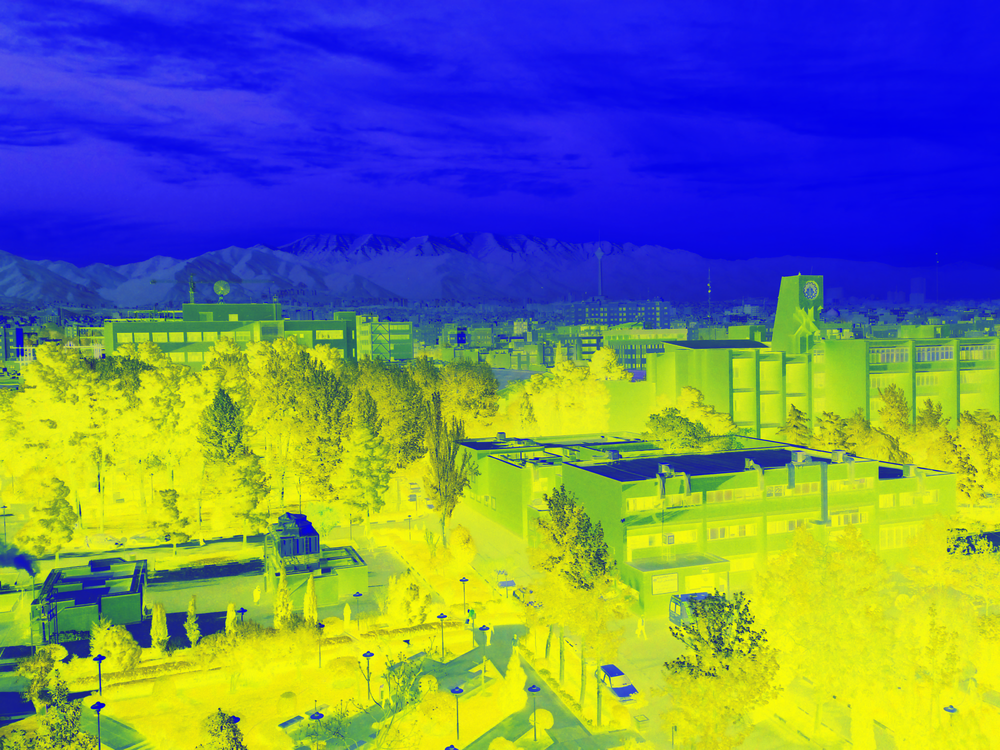

In [99]:
cv2_imshow(out_colorful)

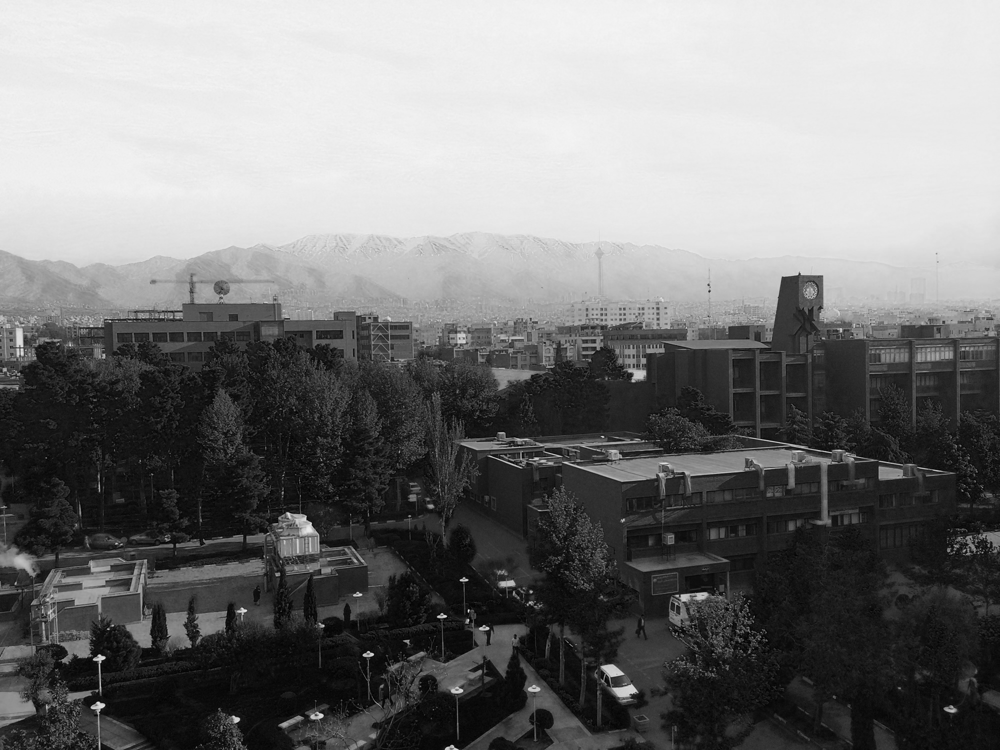

In [94]:
cv2_imshow(r_out[:].transpose())

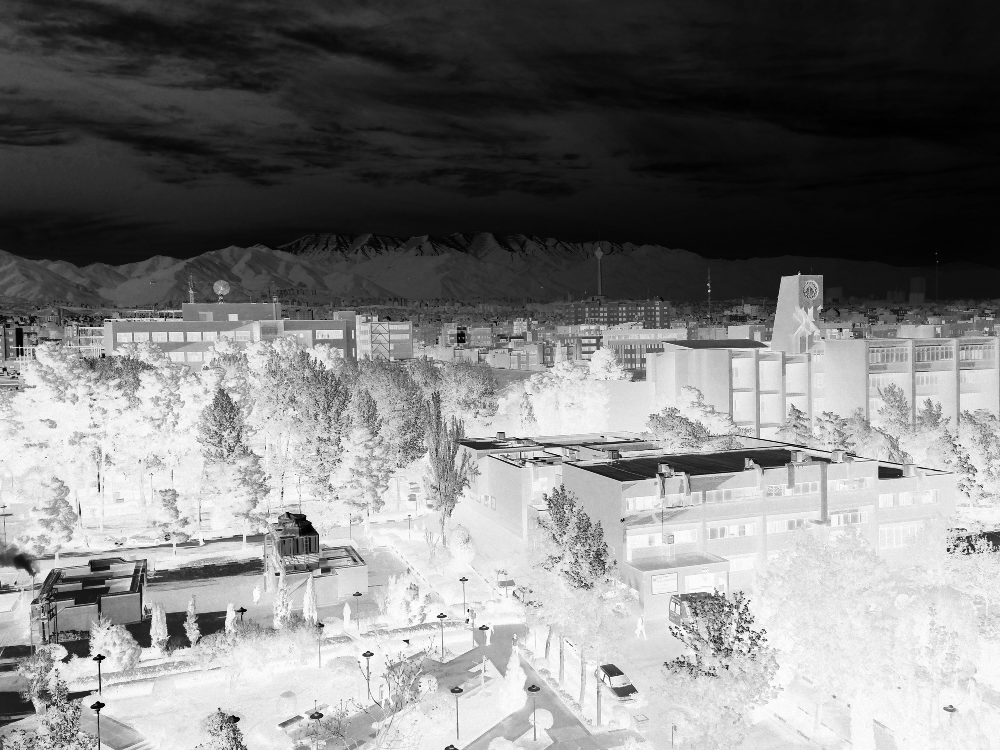

In [95]:
cv2_imshow(g_out[:].transpose())

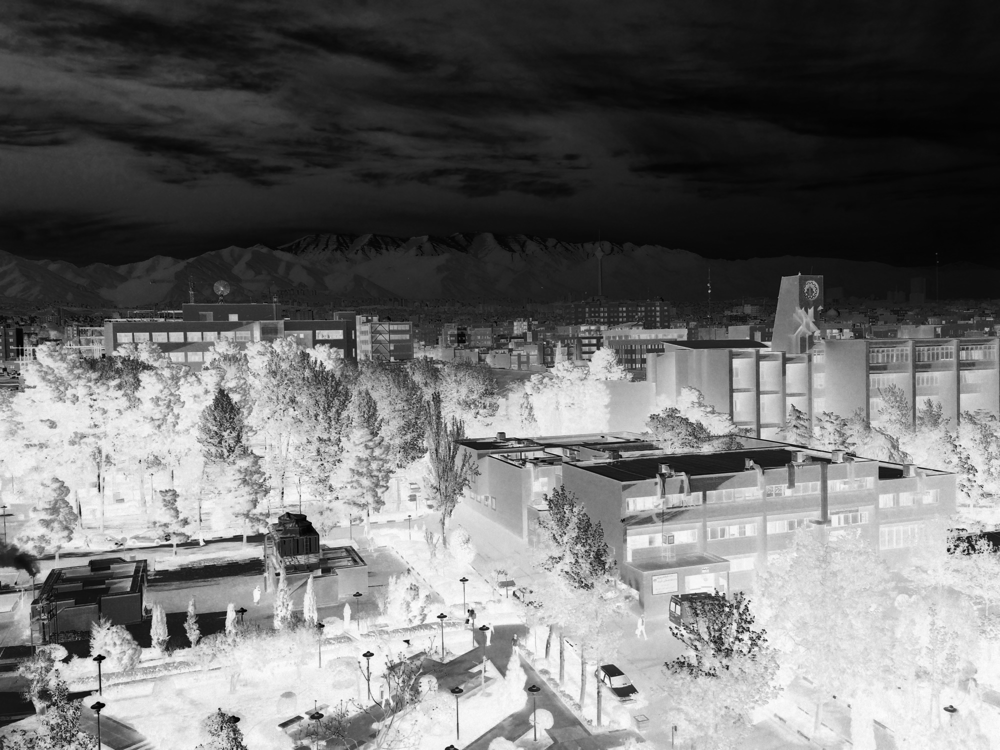

In [86]:
cv2_imshow(b_out[:].transpose())